### Vector Stores and Emdeddings 

Once we are done with Document Loading and Document splitting into chunks . We will create embeddings of chunks and store it in Vector Store 

Recall the overall workflow for retrieval augmented generation (RAG):

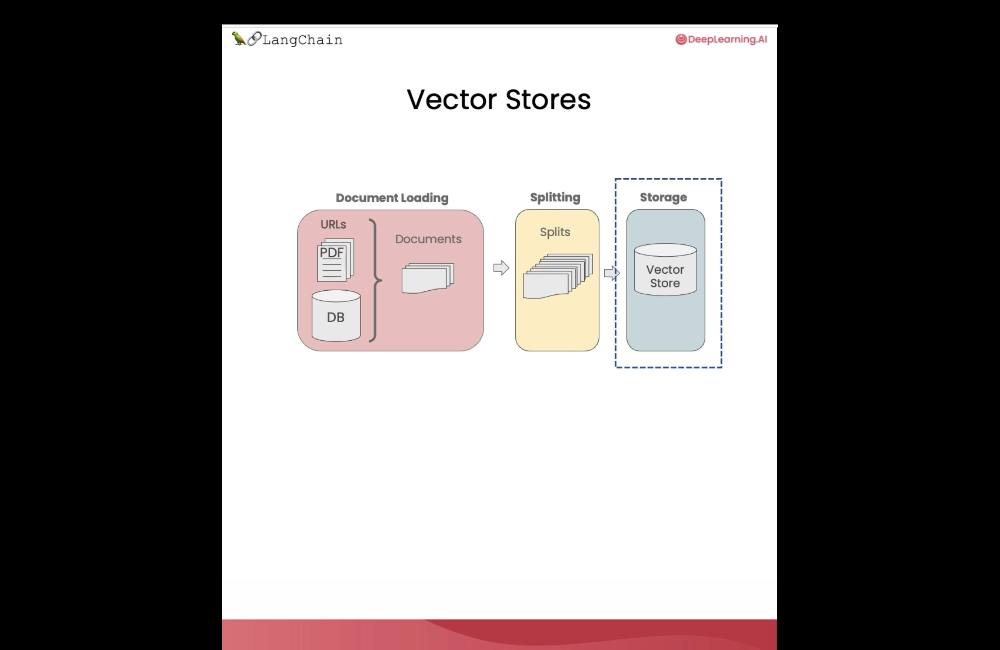

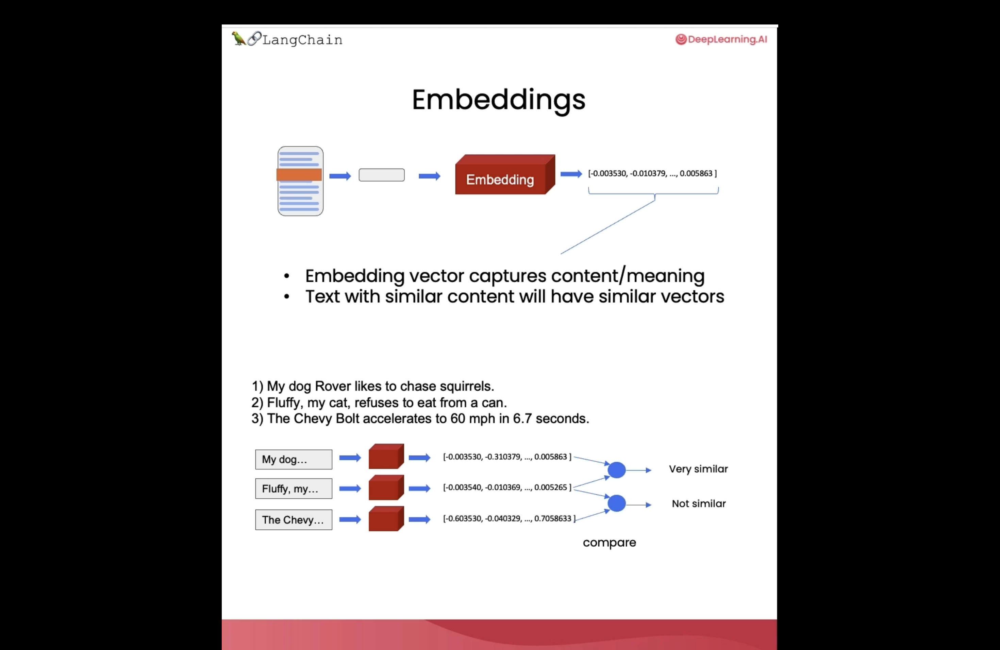

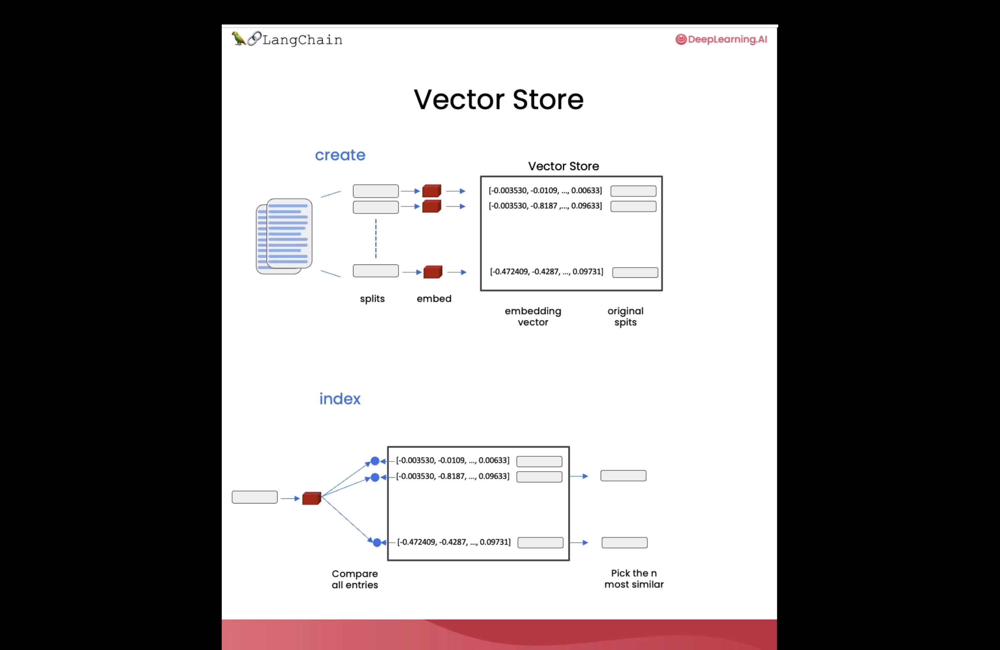

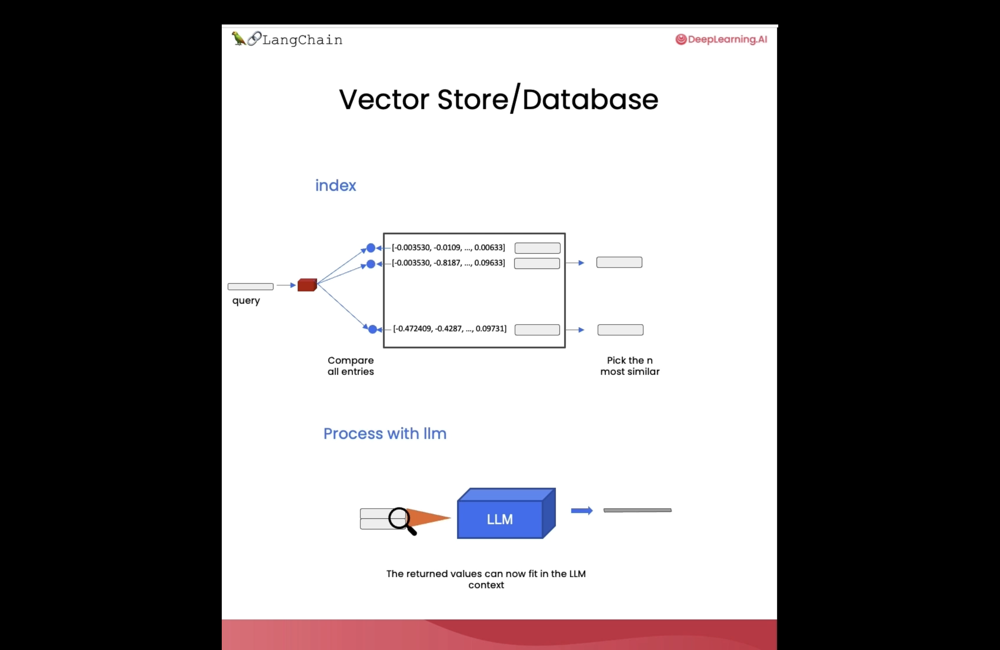

In [1]:
import os
import openai
import sys
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv()) # read local .env file

openai.api_key  = os.environ['OPENAI_API_KEY']

from langchain.document_loaders import PyPDFLoader

# Load PDF
loaders = [
    # Duplicate documents on purpose - messy data
    PyPDFLoader("docs/cs229_lectures/MachineLearning-Lecture01.pdf"),
    PyPDFLoader("docs/cs229_lectures/MachineLearning-Lecture01.pdf"),
    PyPDFLoader("docs/cs229_lectures/MachineLearning-Lecture02.pdf"),
    PyPDFLoader("docs/cs229_lectures/MachineLearning-Lecture03.pdf")
]
docs = []
for loader in loaders:
    docs.extend(loader.load())

# Split
from langchain.text_splitter import RecursiveCharacterTextSplitter
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size = 1500,
    chunk_overlap = 150
)

splits = text_splitter.split_documents(docs)
splits

/Users/mfho-27019739/Desktop/AIML/Github/LLM/.venv/lib/python3.9/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


[Document(page_content="MachineLearning-Lecture01  \nInstructor (Andrew Ng):  Okay. Good morning. Welcome to CS229, the machine \nlearning class. So what I wanna do today is ju st spend a little time going over the logistics \nof the class, and then we'll start to  talk a bit about machine learning.  \nBy way of introduction, my name's  Andrew Ng and I'll be instru ctor for this class. And so \nI personally work in machine learning, and I' ve worked on it for about 15 years now, and \nI actually think that machine learning is th e most exciting field of all the computer \nsciences. So I'm actually always excited about  teaching this class. Sometimes I actually \nthink that machine learning is not only the most exciting thin g in computer science, but \nthe most exciting thing in all of human e ndeavor, so maybe a little bias there.  \nI also want to introduce the TAs, who are all graduate students doing research in or \nrelated to the machine learni ng and all aspects of machin e learn

In [2]:
len(splits)

209

## Embeddings

Let's take our splits and embed them.

In [3]:
from langchain.embeddings.openai import OpenAIEmbeddings
embedding = OpenAIEmbeddings()
sentence1 = "i like dogs"
sentence2 = "i like canines"
sentence3 = "the weather is ugly outside"
embedding1 = embedding.embed_query(sentence1)
embedding2 = embedding.embed_query(sentence2)
embedding3 = embedding.embed_query(sentence3)

## We will use DOT Product to compare the embeddings -Higher is better

import numpy as np
np.dot(embedding1, embedding2)

0.9631675619330522

In [4]:
np.dot(embedding1, embedding3)

0.7710630976675937

In [5]:
np.dot(embedding2, embedding3)

0.7596682675219122

### Vector Store : Chroma DB

In [6]:
# ! pip install chromadb - This is light weight and In-Memory 
from langchain.vectorstores import Chroma
persist_directory = 'docs/chroma/'
!rm -rf ./docs/chroma  # remove old database files if any


In [8]:
vectordb = Chroma.from_documents(
    documents=splits,
    embedding=embedding,
    persist_directory=persist_directory
)

print(vectordb._collection.count())

209


### Similarity Search

In [9]:
question = "is there an email i can ask for help"
docs = vectordb.similarity_search(question,k=3)
docs

[Document(page_content="cs229-qa@cs.stanford.edu. This goes to an acc ount that's read by all the TAs and me. So \nrather than sending us email individually, if you send email to this account, it will \nactually let us get back to you maximally quickly with answers to your questions.  \nIf you're asking questions about homework probl ems, please say in the subject line which \nassignment and which question the email refers to, since that will also help us to route \nyour question to the appropriate TA or to me  appropriately and get the response back to \nyou quickly.  \nLet's see. Skipping ahead — let's see — for homework, one midterm, one open and term \nproject. Notice on the honor code. So one thi ng that I think will help you to succeed and \ndo well in this class and even help you to enjoy this cla ss more is if you form a study \ngroup.  \nSo start looking around where you' re sitting now or at the end of class today, mingle a \nlittle bit and get to know your classmates. I stro

In [10]:
len(docs)

3

In [11]:
docs[0].page_content

"cs229-qa@cs.stanford.edu. This goes to an acc ount that's read by all the TAs and me. So \nrather than sending us email individually, if you send email to this account, it will \nactually let us get back to you maximally quickly with answers to your questions.  \nIf you're asking questions about homework probl ems, please say in the subject line which \nassignment and which question the email refers to, since that will also help us to route \nyour question to the appropriate TA or to me  appropriately and get the response back to \nyou quickly.  \nLet's see. Skipping ahead — let's see — for homework, one midterm, one open and term \nproject. Notice on the honor code. So one thi ng that I think will help you to succeed and \ndo well in this class and even help you to enjoy this cla ss more is if you form a study \ngroup.  \nSo start looking around where you' re sitting now or at the end of class today, mingle a \nlittle bit and get to know your classmates. I strongly encourage you to f

In [12]:
vectordb.persist()

## Failure modes

This seems great, and basic similarity search will get you 80% of the way there very easily. 

But there are some failure modes that can creep up. 

Here are some edge cases that can arise - we'll fix them in the next class.

In [13]:
question = "what did they say about matlab?"
docs = vectordb.similarity_search(question,k=5)
docs

[Document(page_content='those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people call it a free ve rsion of MATLAB, which it sort  of is, sort of isn\'t.  \nSo I guess for those of you that haven\'t s een MATLAB before, and I know most of you \nhave, MATLAB is I guess part of the programming language that makes it very easy to write codes using matrices, to write code for numerical routines, to move data around, to \nplot data. And it\'s sort of an extremely easy to  learn tool to use for implementing a lot of \nlearning algorithms.  \nAnd in case some of you want to work on your  own home computer or something if you \ndon\'t have a MATLAB license, for the purposes of  this class, there\'s also — [inaudible] \nwrite that down [inaudible] MATLAB — there\' s also a software package called Octave \nthat you can download for free off the Internet. And it has somewhat fewer features than MATLAB, but it\'s free, and for the purposes of  this class

Notice that we're getting duplicate chunks (because of the duplicate `MachineLearning-Lecture01.pdf` in the index).

Semantic search fetches all similar documents, but does not enforce diversity.

`docs[0]` and `docs[1]` are indentical.

We can see a new failure mode.

The question below asks a question about the third lecture, but includes results from other lectures as well.

In [16]:
question = "what did they say about regression in the third lecture?"
docs = vectordb.similarity_search(question,k=5)
for doc in docs:
    print(doc.metadata)
## It is also focusing more on regression word in question. And information related to regression is in Lecture 02 .

{'page': 0, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 2, 'source': 'docs/cs229_lectures/MachineLearning-Lecture02.pdf'}
{'page': 14, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 4, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 0, 'source': 'docs/cs229_lectures/MachineLearning-Lecture02.pdf'}


In [15]:
print(docs[4].page_content)

really makes a difference between a good so lution and amazing solution. And to give 
everyone to just how we do points assignments, or what is it that causes a solution to get 
full marks, or just how to write amazing so lutions. Becoming a grad er is usually a good 
way to do that.  
Graders are paid positions and you also get free  food, and it's usually fun for us to sort of 
hang out for an evening and grade all the a ssignments. Okay, so I will send email. So 
don't email me yet if you want to be a grader. I'll send email to the entire class later with 
the administrative details and to solicit app lications. So you can email us back then, to 
apply, if you'd be interested in being a grader.  
Okay, any questions about that? All right, okay, so let's get started with today's material. 
So welcome back to the second lecture. What  I want to do today is talk about linear 
regression, gradient descent, and the norma l equations. And I should also say, lecture 
notes have been posted

### How to adress the Above Failure Modes .

## RETRIEVAL 

We will look into how we will adress above issues.

Now once you have Query . You will look for similar vectors in Vector Store. But sometimes we might face above failure modes while Retrieving . Previouslt we learned about SemanticSimilarity Search . We will now look into Advanced Methods 

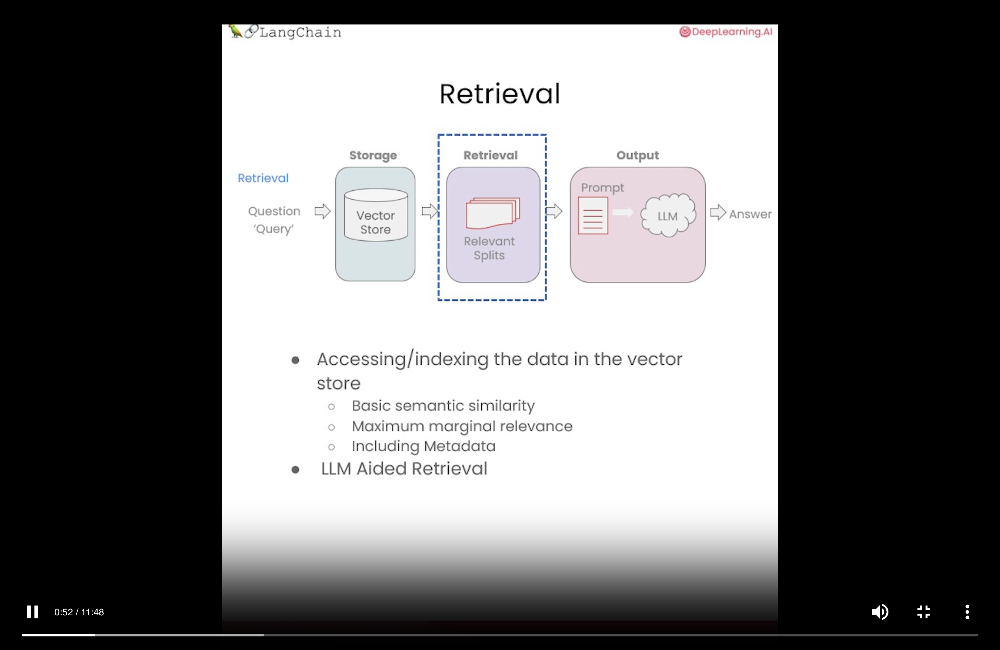

### Maximum Marginal Relevance 


We will not only take Similar documents , But we will also consider Diverse set of documents 

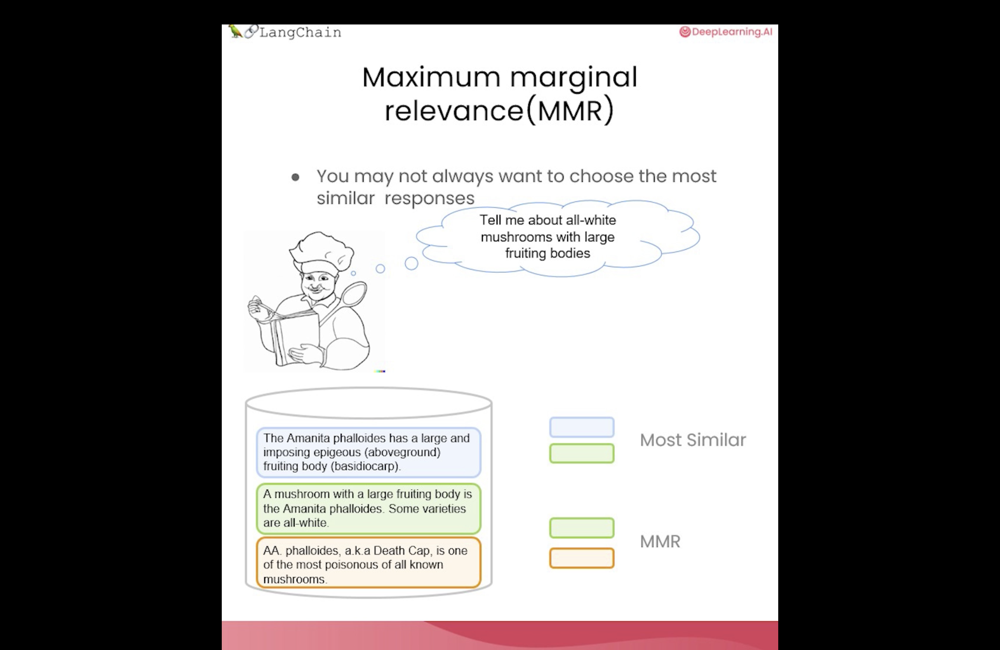

Idea Behind MMR :

- We first send the query and get the responses based on fetc_k which we have specified. This is totally based on semantic similarity 
- From that responses . We will not only look into similar documents . But we will also look into most diverse documents 
- And from that set of documents . We will choose final k

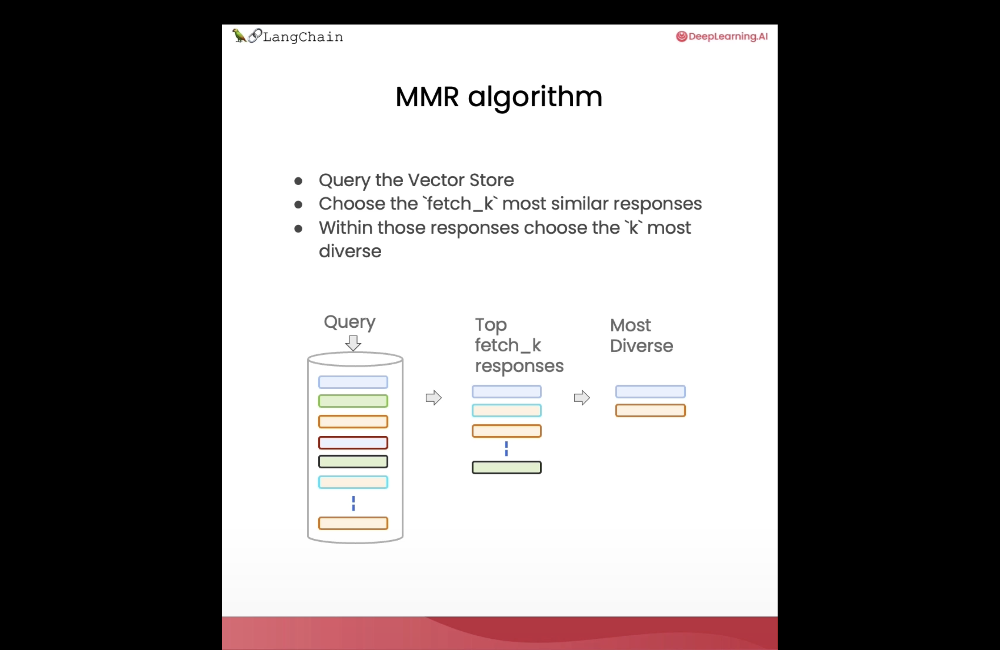

### LLM Based Retrieval 

- This is helpfull , When you get questions that arent surely about content that you want to look up semantically  .  But also include some metadata that you want to do filter on.

Aliens - Semantic Part 
Metadata - Year 1980

We will use LLM itself to split question into two parts - Filter and search term 

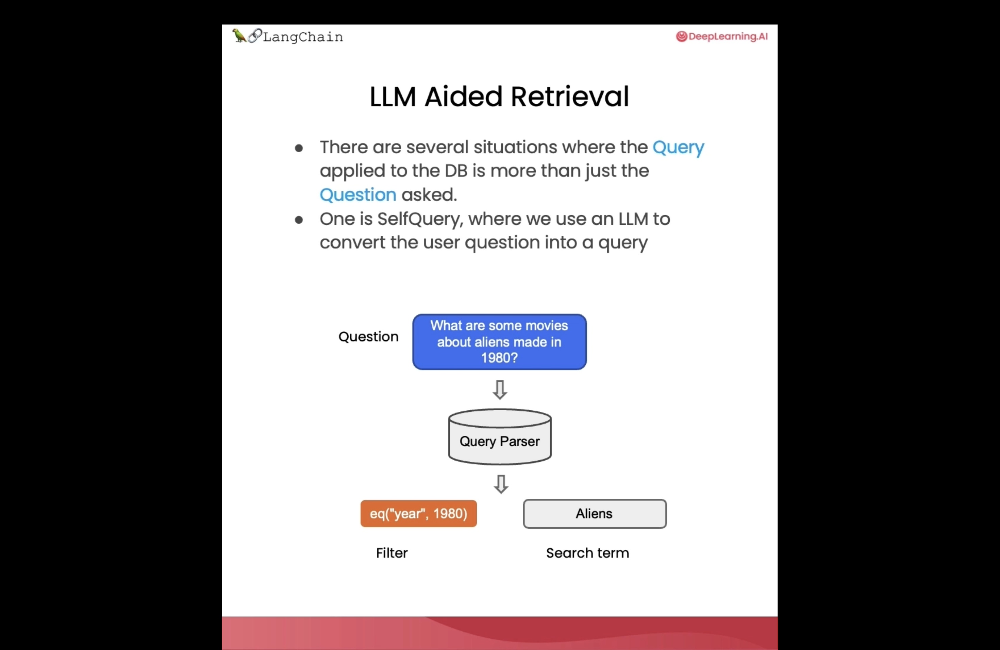

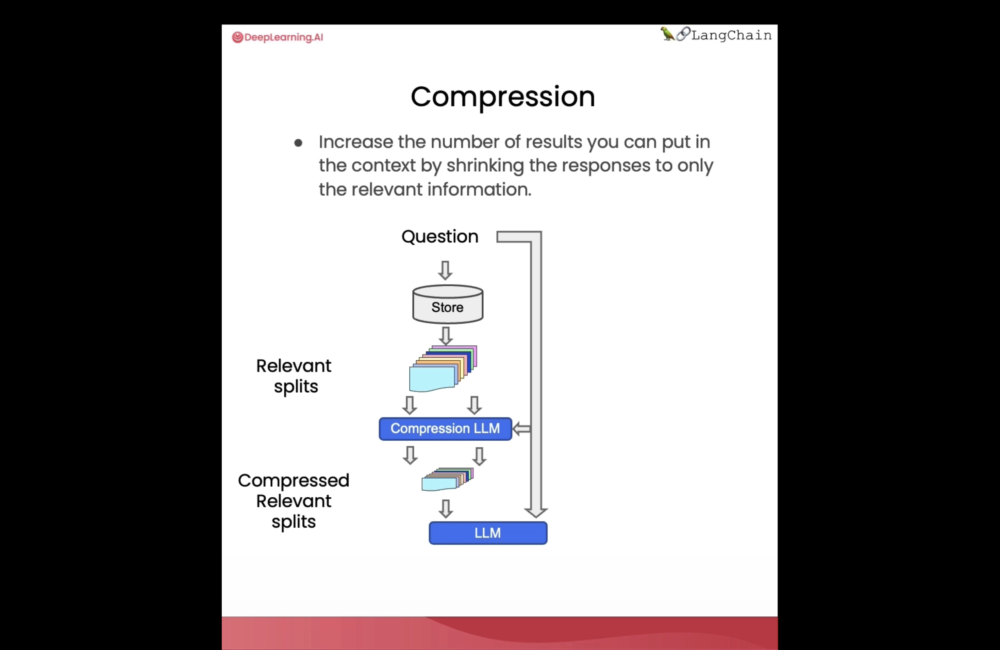

# Retrieval

Retrieval is the centerpiece of our retrieval augmented generation (RAG) flow. 

Let's get our vectorDB from before.

In [17]:
import os
import openai
import sys
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv()) # read local .env file

openai.api_key  = os.environ['OPENAI_API_KEY']

### Similarity Search

In [18]:
from langchain.vectorstores import Chroma
from langchain.embeddings.openai import OpenAIEmbeddings
persist_directory = 'docs/chroma/'

embedding = OpenAIEmbeddings()
vectordb = Chroma(
    persist_directory=persist_directory,
    embedding_function=embedding
)
print(vectordb._collection.count())

209


In [19]:
### We will look into MMR - Why it is needed

texts = [
    """The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).""",
    """A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.""",
    """A. phalloides, a.k.a Death Cap, is one of the most poisonous of all known mushrooms.""",
]

### For This we will create a small db to check and demo MMR

smalldb = Chroma.from_texts(texts, embedding=embedding)
smalldb

### Similarity Search 

In below example . As we can see that it is not considering other diverse document . Which has mention of poison , So similarity search doeas not take care about Diverse Documents

In [20]:
question = "Tell me about all-white mushrooms with large fruiting bodies"
smalldb.similarity_search(question, k=2)


[Document(page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(page_content='The Amanita phalloides has a large and imposing epigeous (aboveground) fruiting body (basidiocarp).')]

### MMR 

Here is Considers both Similar and Diverse documents 

In [21]:
smalldb.max_marginal_relevance_search(question,k=2, fetch_k=3)

[Document(page_content='A mushroom with a large fruiting body is the Amanita phalloides. Some varieties are all-white.'),
 Document(page_content='A. phalloides, a.k.a Death Cap, is one of the most poisonous of all known mushrooms.')]

### Addressing Diversity: Maximum marginal relevance

Last class we introduced one problem: how to enforce diversity in the search results.
 
`Maximum marginal relevance` strives to achieve both relevance to the query *and diversity* among the results.

In [22]:
question = "what did they say about matlab?"
docs_ss = vectordb.similarity_search(question,k=3)
docs_ss

[Document(page_content='those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people call it a free ve rsion of MATLAB, which it sort  of is, sort of isn\'t.  \nSo I guess for those of you that haven\'t s een MATLAB before, and I know most of you \nhave, MATLAB is I guess part of the programming language that makes it very easy to write codes using matrices, to write code for numerical routines, to move data around, to \nplot data. And it\'s sort of an extremely easy to  learn tool to use for implementing a lot of \nlearning algorithms.  \nAnd in case some of you want to work on your  own home computer or something if you \ndon\'t have a MATLAB license, for the purposes of  this class, there\'s also — [inaudible] \nwrite that down [inaudible] MATLAB — there\' s also a software package called Octave \nthat you can download for free off the Internet. And it has somewhat fewer features than MATLAB, but it\'s free, and for the purposes of  this class

In [23]:
docs_ss[0].page_content[:100]

'those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people '

In [24]:
docs_ss[1].page_content[:100]

'those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people '

Note the difference in results with `MMR`.

In [25]:
docs_mmr = vectordb.max_marginal_relevance_search(question,k=3)
docs_mmr

[Document(page_content='those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people call it a free ve rsion of MATLAB, which it sort  of is, sort of isn\'t.  \nSo I guess for those of you that haven\'t s een MATLAB before, and I know most of you \nhave, MATLAB is I guess part of the programming language that makes it very easy to write codes using matrices, to write code for numerical routines, to move data around, to \nplot data. And it\'s sort of an extremely easy to  learn tool to use for implementing a lot of \nlearning algorithms.  \nAnd in case some of you want to work on your  own home computer or something if you \ndon\'t have a MATLAB license, for the purposes of  this class, there\'s also — [inaudible] \nwrite that down [inaudible] MATLAB — there\' s also a software package called Octave \nthat you can download for free off the Internet. And it has somewhat fewer features than MATLAB, but it\'s free, and for the purposes of  this class

In [26]:
docs_mmr[0].page_content[:100]

'those homeworks will be done in either MATLA B or in Octave, which is sort of — I \nknow some people '

In [27]:
docs_mmr[1].page_content[:100]

'algorithm then? So what’s different? How come  I was making all that noise earlier about \nleast squa'

### Addressing Specificity: working with metadata

In last lecture, we showed that a question about the third lecture can include results from other lectures as well.

To address this, many vectorstores support operations on `metadata`.

`metadata` provides context for each embedded chunk.

If we dont apply filter. We will get data from other pdfs as well.

In [28]:
question = "what did they say about regression in the third lecture?"
docs = vectordb.similarity_search(
    question,
    k=3,
    filter={"source":"docs/cs229_lectures/MachineLearning-Lecture03.pdf"}
)
for d in docs:
    print(d.metadata)

{'page': 0, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 14, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 4, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}


### Now we will iuse Language Model for above Filter process 

### Addressing Specificity: working with metadata using self-query retriever

But we have an interesting challenge: we often want to infer the metadata from the query itself.

To address this, we can use `SelfQueryRetriever`, which uses an LLM to extract:
 
1. The `query` string to use for vector search
2. A metadata filter to pass in as well

Most vector databases support metadata filters, so this doesn't require any new databases or indexes.

In [29]:
from langchain.llms import OpenAI
from langchain.retrievers.self_query.base import SelfQueryRetriever
from langchain.chains.query_constructor.base import AttributeInfo

## Here we are creating our own metadata 

metadata_field_info = [

    ## Here we can specify different fields. And what they correspond to 
    AttributeInfo(
        name="source",
        description="The lecture the chunk is from, should be one of `docs/cs229_lectures/MachineLearning-Lecture01.pdf`, `docs/cs229_lectures/MachineLearning-Lecture02.pdf`, or `docs/cs229_lectures/MachineLearning-Lecture03.pdf`",
        type="string",
    ),
    AttributeInfo(
        name="page",
        description="The page from the lecture",
        type="integer",
    ),
]

document_content_description = "Lecture notes"
llm = OpenAI(temperature=0)
retriever = SelfQueryRetriever.from_llm(
    llm,
    vectordb,
    document_content_description,
    metadata_field_info,
    verbose=True
)

question = "what did they say about regression in the third lecture?"

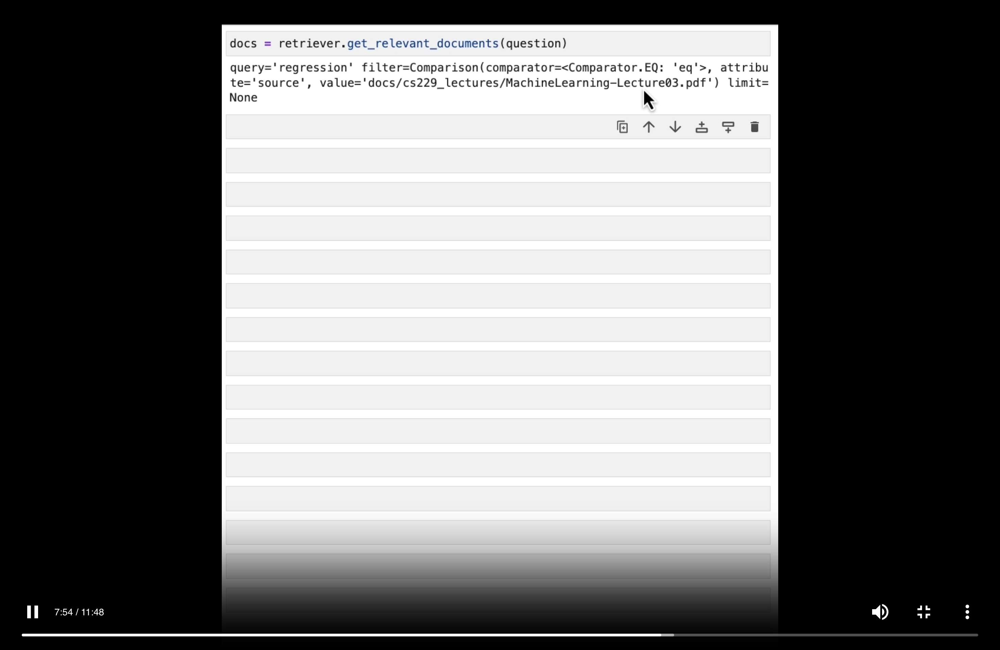

In [30]:
docs = retriever.get_relevant_documents(question)

In [31]:
for d in docs:
    print(d.metadata)

{'page': 14, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 0, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 10, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}
{'page': 10, 'source': 'docs/cs229_lectures/MachineLearning-Lecture03.pdf'}


### Additional tricks: compression

Another approach for improving the quality of retrieved docs is compression.

Information most relevant to a query may be buried in a document with a lot of irrelevant text. 

Passing that full document through your application can lead to more expensive LLM calls and poorer responses.

Contextual compression is meant to fix this. 

Will only extractt the most relevant documents 

In [ ]:
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import LLMChainExtractor

def pretty_print_docs(docs):
    print(f"\n{'-' * 100}\n".join([f"Document {i+1}:\n\n" + d.page_content for i, d in enumerate(docs)]))

# Wrap our vectorstore
llm = OpenAI(temperature=0)
compressor = LLMChainExtractor.from_llm(llm)

compression_retriever = ContextualCompressionRetriever(
    base_compressor=compressor,
    base_retriever=vectordb.as_retriever()
)

question = "what did they say about matlab?"
compressed_docs = compression_retriever.get_relevant_documents(question)
pretty_print_docs(compressed_docs)

As you can see , Now we are not getting irrelavant text. We are only relevant text. 

But we are still getting same text because they use semantic search algo . We can resolve this by using MMR . 

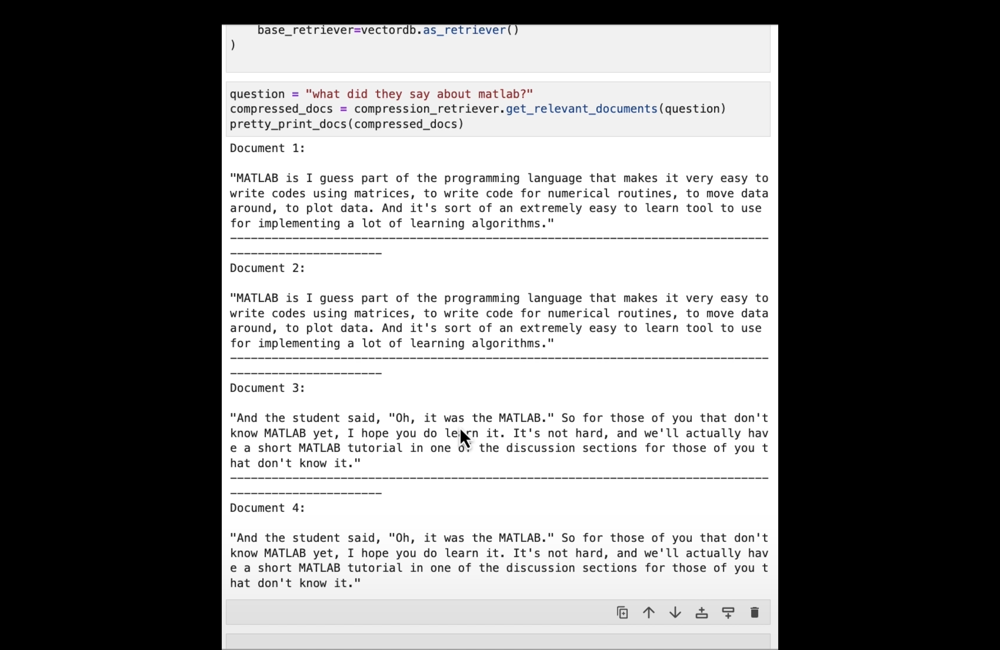

## Combining various techniques


So now we will use MMR with SelfRetrieval 

In [ ]:
compression_retriever = ContextualCompressionRetriever(
    base_compressor=compressor,
    base_retriever=vectordb.as_retriever(search_type = "mmr")
)

question = "what did they say about matlab?"
compressed_docs = compression_retriever.get_relevant_documents(question)
pretty_print_docs(compressed_docs)

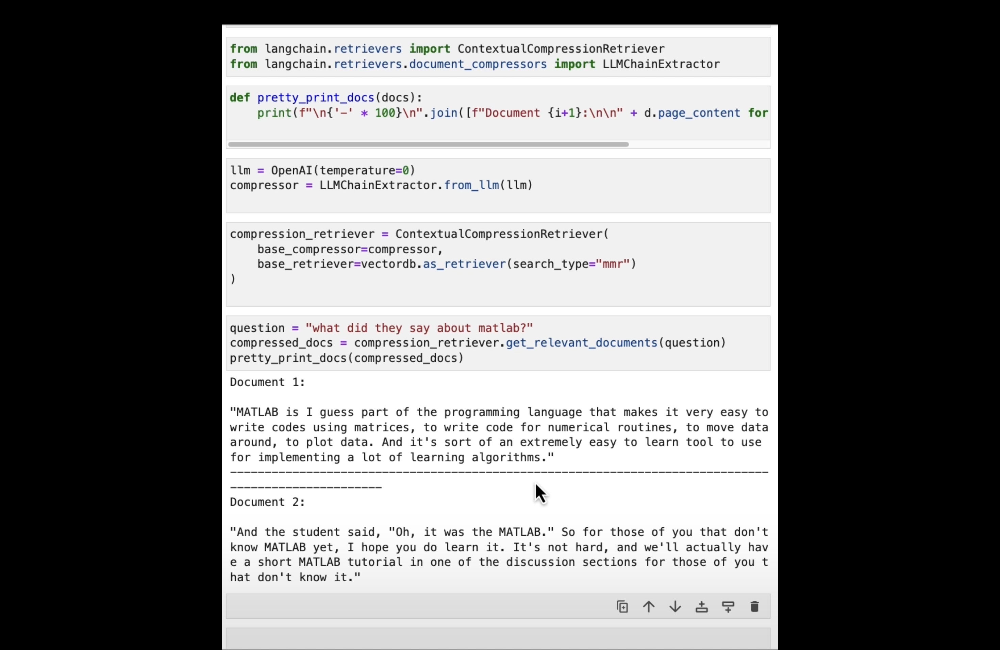

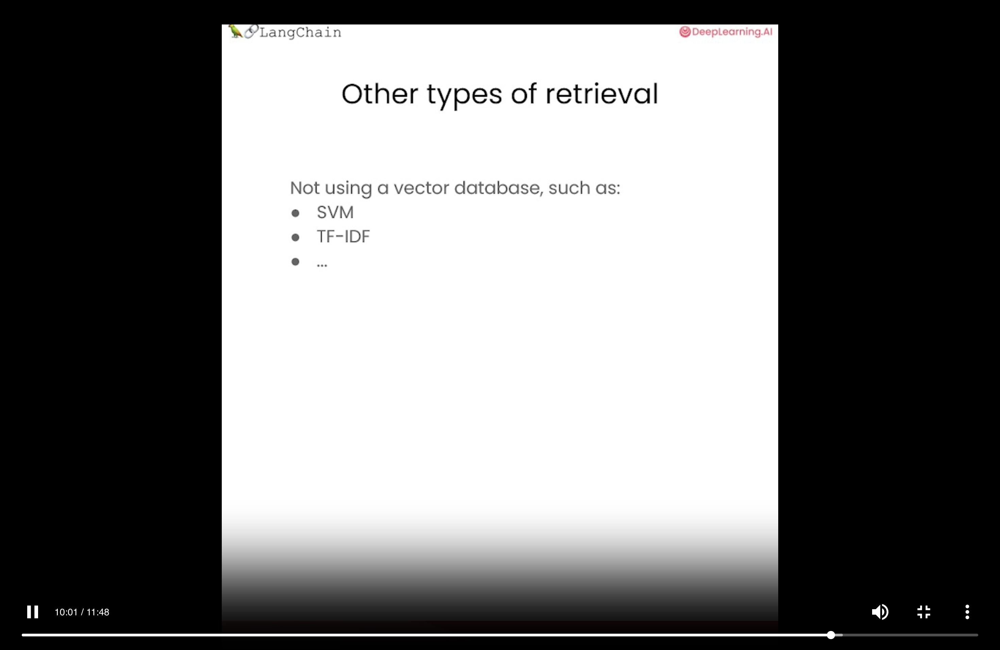

## Other types of retrieval

It's worth noting that vectordb as not the only kind of tool to retrieve documents. 

The `LangChain` retriever abstraction includes other ways to retrieve documents, such as TF-IDF or SVM.

In [ ]:
from langchain.retrievers import SVMRetriever
from langchain.retrievers import TFIDFRetriever
from langchain.document_loaders import PyPDFLoader
from langchain.text_splitter import RecursiveCharacterTextSplitter

# Load PDF
loader = PyPDFLoader("docs/cs229_lectures/MachineLearning-Lecture01.pdf")
pages = loader.load()
all_page_text=[p.page_content for p in pages]
joined_page_text=" ".join(all_page_text)

# Split
text_splitter = RecursiveCharacterTextSplitter(chunk_size = 1500,chunk_overlap = 150)
splits = text_splitter.split_text(joined_page_text)

# Retrieve
svm_retriever = SVMRetriever.from_texts(splits,embedding)
tfidf_retriever = TFIDFRetriever.from_texts(splits)

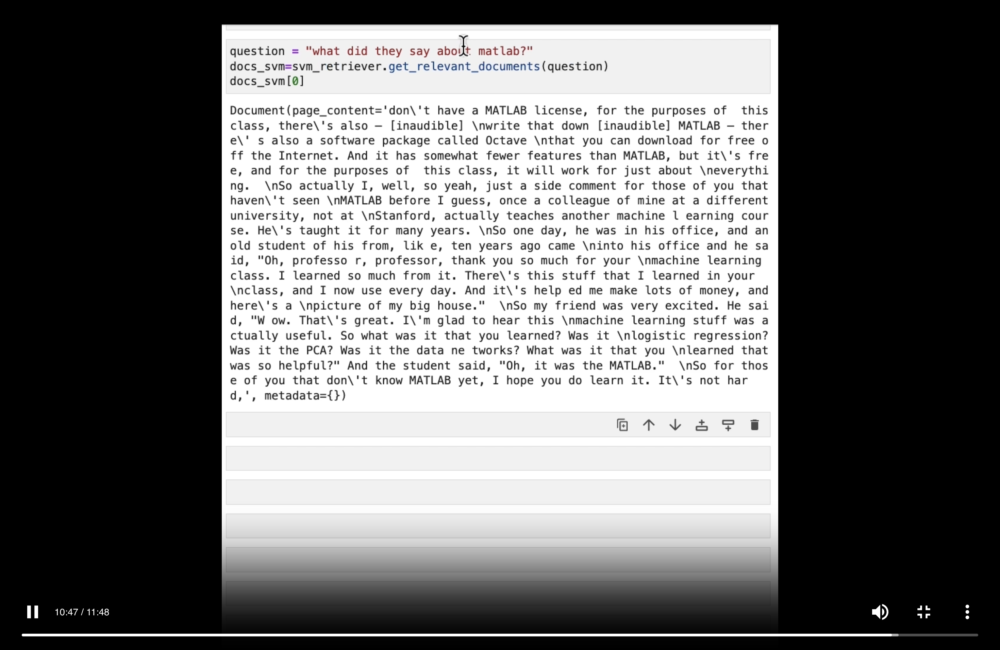

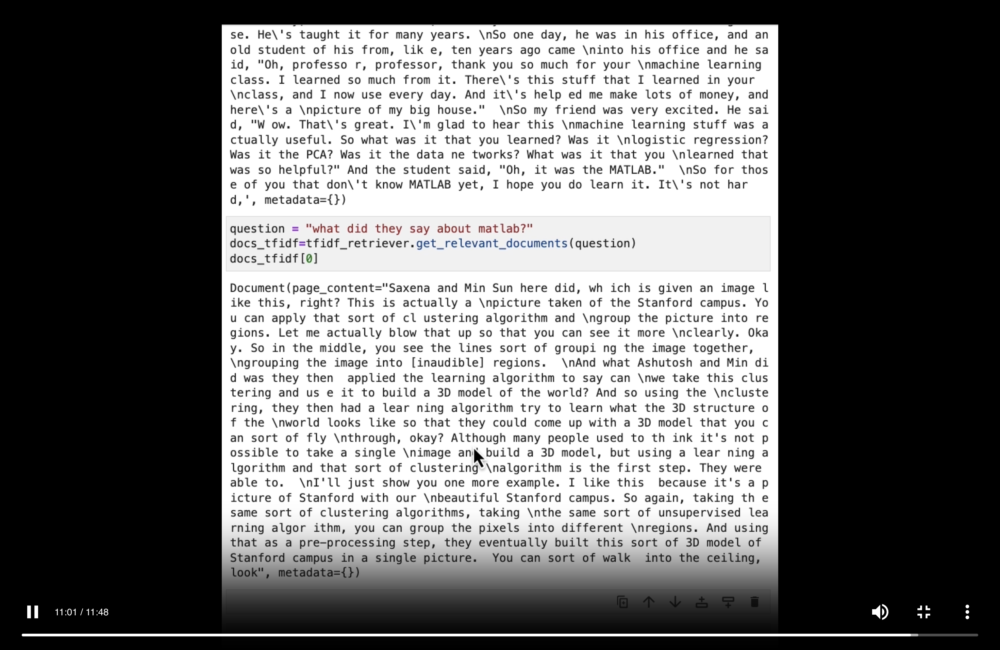